In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import math

In [3]:
df = pd.read_csv(r'C:\Users\DeLL\Desktop\Global terrorism\globalterrorismdb_0718dist.csv', encoding='ISO-8859-1',low_memory=False)

In [4]:
df.shape

(181691, 135)

There are more than 180K rows and 135 columns. Very large number of columns. We must first look at each column of this dataset. Are all columns needed for further analysis? Or there are columns that are not really needed for further analysis.



In [5]:
df.head(3)

,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
0,197000000001,1970,7,2,NaN,0,NaN,58,Dominican Republic,2,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
1,197000000002,1970,0,0,NaN,0,NaN,130,Mexico,1,...,NaN,NaN,NaN,NaN,PGIS,0,1,1,1,NaN
2,197001000001,1970,1,0,NaN,0,NaN,160,Philippines,5,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN


## Selection of Columns to be used in the analysis
Columns with too many Missing Values will be very difficult to analyze. In this case, we will drop the column with Missing Value more than 50%.

In [6]:
#Specifies the percent of data that is blank for each column
len_df = len(df)
percent_null = []
for item in df.columns:
    count_null = df[item].isnull().sum()
    percent_null.append(count_null/len_df*100)

In [7]:
percent_column_null = pd.DataFrame({'column_name':df.columns, 'percent_null(%)':percent_null})
percent_column_null

,column_name,percent_null(%)
0,eventid,0.000000
1,iyear,0.000000
2,imonth,0.000000
3,iday,0.000000
4,approxdate,94.914993
...,...,...
130,INT_LOG,0.000000
131,INT_IDEO,0.000000
132,INT_MISC,0.000000
133,INT_ANY,0.000000


Many columns turned out to have a Missing Value of more than 50%, some even more than 90%. We will not use these columns.

In [8]:
#Drop Missing Value column> 50%
column_to_drop = []
for i in range(len(percent_column_null)):
    if percent_column_null['percent_null(%)'][i] > 50:
        column_to_drop.append(percent_column_null['column_name'][i])

In [9]:
df2 = df.drop(column_to_drop, axis=1)

In [10]:
len(df2.columns)

58


Of the 135 columns, there are only 58 columns whose missing value is no more than 50%

There are also columns that actually show the same value, for example the country column with country_txt. The difference is that the country column shows the numbers while country_txt shows the name of the country. In this analysis, we will use only columns containing 'txt'.

In [11]:
column_to_drop = []
for element in df2.columns:
    if 'txt' in element:
        column_to_drop.append(element[:-4])
df2.drop(column_to_drop, axis=1, inplace=True)

In [12]:
len(df2.columns)

50

There are only 50 columns left. These columns will then be selected again according to what columns will be used.


In [13]:
# Make a list of column names used for analysis
column_to_use = ['iyear', 'imonth', 'country_txt', 'region_txt', 'provstate', 'city', 'latitude', 'longitude', 'attacktype1_txt',
                'weaptype1_txt', 'targtype1_txt', 'natlty1_txt', 'INT_IDEO', 'success', 'suicide', 'gname', 'individual', 'nkill', 'nwound']

In [14]:
df2 = df[column_to_use]

In [15]:
# Change the name of the columns to make it easier to call
df2.columns = ['Year', 'Month', 'Country', 'Region', 'Province', 'City', 'Lat', 'Long',
               'AttType', 'Weapon', 'TargetType', 'NatTarget', 'TerNat', 'Success', 'Suicide', 'GroupName', 'Individual', 'NumberKill', 'NumberWound']

In [16]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181691 entries, 0 to 181690
Data columns (total 19 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   Year         181691 non-null  int64  
 1   Month        181691 non-null  int64  
 2   Country      181691 non-null  object 
 3   Region       181691 non-null  object 
 4   Province     181270 non-null  object 
 5   City         181257 non-null  object 
 6   Lat          177135 non-null  float64
 7   Long         177134 non-null  float64
 8   AttType      181691 non-null  object 
 9   Weapon       181691 non-null  object 
 10  TargetType   181691 non-null  object 
 11  NatTarget    180132 non-null  object 
 12  TerNat       181691 non-null  int64  
 13  Success      181691 non-null  int64  
 14  Suicide      181691 non-null  int64  
 15  GroupName    181691 non-null  object 
 16  Individual   181691 non-null  int64  
 17  NumberKill   171378 non-null  float64
 18  NumberWound  165380 non-

In [17]:
df2.nunique()

Year              47
Month             13
Country          205
Region            12
Province        2855
City           36674
Lat            48322
Long           48039
AttType            9
Weapon            12
TargetType        22
NatTarget        215
TerNat             3
Success            2
Suicide            2
GroupName       3537
Individual         2
NumberKill       205
NumberWound      238
dtype: int64

## Explanation of Column Names Used
There are 19 columns used in this analysis. The 19 columns are as follows:

Year: The year in which terrorism took place, the data available are from 1970 - 2017.

Month: Month of Terosime action takes place, 0-12, Month 0 means the month of occurrence is unknown.

Country: Name of the country where the terrorist act took place. There are 205 different countries in this dataset.

Region: Name of the area where terrorism takes place. For example, Indonesia is in the Southeast Asia Region (Southeast Asia).

Province: District Name or Province Name Occurring event.

City: Name of the city where the incident took place.

Lat: Latitude or latitude of the event in progress.

Long: Longitude or longitude of the event in progress.

AttType: Column of how terrorist acts are carried out. There are 9 unique values ​​from this column.

Weapon: A type of weapon used in action. There are 12 types of unique weapons contained in the dataset.

TargetType: Target or Victim of the action taken. There are 22 different target types.

NatTarget: Nationality of the Target being attacked.

TerNat: Nationality from terrorists. 1: different from being attacked, 0: same as being attacked, -9: unknown

Success: Terrorism is successful or not. 1: Success, 0: No success.

Suicide: 1: Suicide, 2: Not suicide.

GroupName: Group or group that commits acts of terrorism.

Individual: Actions carried out individually or not. 1: individual, 0: group

NumberKill: Acts of terrorism take several lives

NumberWound: Acts of terrorism cause how many people are injured

# Empty Data Handling

In [18]:
df2.isnull().sum()

Year               0
Month              0
Country            0
Region             0
Province         421
City             434
Lat             4556
Long            4557
AttType            0
Weapon             0
TargetType         0
NatTarget       1559
TerNat             0
Success            0
Suicide            0
GroupName          0
Individual         0
NumberKill     10313
NumberWound    16311
dtype: int64

There are empty data from the Province and City columns. We can fill this data based on Latitude and Longitude.

## Fill Missing Value for City

In [19]:
#Create df_test_city which is City, Lat, and Long data that is not null
df_test_city = df2[(df2['City'].notnull()) & (df2['Lat'].notnull()) & (df2['Long'].notnull())]

#Create df_predict_city which is city data that is empty, but Lat and Long are not null
df_predict_city = df2[(df2['City'].isnull()) & (df2['Lat'].notnull()) & (df2['Long'].notnull())]

In [20]:
len(df_predict_city)

426

The data values are empty in City but Latitude and Longitude are not empty. There are 426 data from 434 City data that are empty. This means we can fill almost all City data that is empty.

In [21]:
def fill_city(df):
    lat_diff = np.abs(df['Lat'] - df_test_city['Lat'])
    long_diff = np.abs(df['Long'] - df_test_city['Long'])
    diff = lat_diff+long_diff
    index_min = np.argmin(diff,axis=0,out=None)
    return df_test_city['City'].loc[index_min]

In [22]:
idx_city_change = df_predict_city.index
df_test_city=df_test_city.reset_index(drop=True)

In [23]:
# Fill in the empty city data using apply
df2.loc[idx_city_change, 'City'] = df_predict_city.apply(fill_city, axis=1)

C:\Users\DeLL\anaconda3\lib\site-packages\pandas\core\indexing.py:966: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


In [24]:
df2.isnull().sum()

Year               0
Month              0
Country            0
Region             0
Province         421
City               8
Lat             4556
Long            4557
AttType            0
Weapon             0
TargetType         0
NatTarget       1559
TerNat             0
Success            0
Suicide            0
GroupName          0
Individual         0
NumberKill     10313
NumberWound    16311
dtype: int64

8 City data remaining that are still empty. We will drop the data, because the amount is not too much.

In [25]:
df2 = df2.dropna(subset=['City'])

## Fill in Missing Value for Province
Filling missing Province values almost the same as City, which is looking for the nearest latitude and longitude. Based on the  information, the number of missing province values are 421.

In [26]:
df_test_province = df2[(df2['Province'].notnull()) & (df2['Lat'].notnull()) & (df2['Long'].notnull())]
df_predict_province = df2[(df2['Province'].isnull()) & (df2['Lat'].notnull()) & (df2['Long'].notnull())]

In [27]:
len(df_predict_province)

409


409 data to be filled out of 421 NaN Province data

In [28]:
def fill_province(df):
    lat_diff = np.abs(df['Lat'] - df_test_province['Lat'])
    long_diff = np.abs(df['Long'] - df_test_province['Long'])
    diff = lat_diff+long_diff
    index_min = np.argmin(diff)
    return df_test_province['Province'].loc[index_min]

In [29]:
idx_prov_change = df_predict_province.index
df_test_province=df_test_province.reset_index(drop=True)

In [30]:
df2.loc[idx_prov_change, 'Province'] = df_predict_province.apply(fill_province, axis=1)

In [31]:
df2.isnull().sum()

Year               0
Month              0
Country            0
Region             0
Province          12
City               0
Lat             4548
Long            4549
AttType            0
Weapon             0
TargetType         0
NatTarget       1559
TerNat             0
Success            0
Suicide            0
GroupName          0
Individual         0
NumberKill     10313
NumberWound    16311
dtype: int64

Similar to city data, we will also drop Provincial data which is still empty.

In [32]:
df2 = df2.dropna(subset=['Province'])

## Fill Latitude and Longitude

In [33]:
df2[df2.Lat.isnull()]['City'].value_counts()

Unknown        2239
unknown          46
Nationwide       24
Nationwide*      17
Puerto Rico      14
               ... 
Taygun            1
Keceoren          1
Armas             1
Mugina            1
sudhapora         1
Name: City, Length: 1859, dtype: int64

In [34]:
df2[df2.Lat.isnull()]['Country'].value_counts()

El Salvador            472
Colombia               471
Nicaragua              398
Philippines            380
Peru                   288
                      ... 
Czechoslovakia           1
Kyrgyzstan               1
St. Kitts and Nevis      1
Croatia                  1
Yugoslavia               1
Name: Country, Length: 141, dtype: int64

Lines with Lat and Long are empty, most have City values ​​in the form Unknown. Therefore, we cannot use City to fill Lat and Long. Instead, the Country column is all filled in. So that we can fill Lat and Long based on the value from Country.

In [35]:
mean_lat_country = df2.groupby('Country').mean()['Lat']
mean_long_country = df2.groupby('Country').mean()['Long']

In [36]:
# Create a function to fill in the blank latitude and longitude with the mean of the latitude or longitude of the country
def func_lat(df):
    if pd.isnull(df.Lat):
        return mean_lat_country[df.Country]
    else:
        return df.Lat
    
def func_long(df):
    if pd.isnull(df.Long):
        return mean_long_country[df.Country]
    else:
        return df.Long

In [37]:
df2['Lat'] = df2.apply(func_lat, axis=1)

In [38]:
df2['Long'] = df2.apply(func_long, axis=1)

In [39]:
df2.isnull().sum()

Year               0
Month              0
Country            0
Region             0
Province           0
City               0
Lat                1
Long               1
AttType            0
Weapon             0
TargetType         0
NatTarget       1559
TerNat             0
Success            0
Suicide            0
GroupName          0
Individual         0
NumberKill     10311
NumberWound    16309
dtype: int64

In [40]:
# Delete Lat and Long data that is still empty
df2.dropna(subset=['Lat', 'Long'], inplace=True)

The data that is still empty is now in the NatTarget, NumberKill, and NumberWound columns. It is difficult to predict these data. We can just fill in the average number of deaths in each country. But this will damage the data. We can also do the drop, but this will cause a lot of data to be lost even though we could have done an analysis not of NatTarget, NumberKill or NumberWound. Therefore, we should leave df2 like this. The data with data without missing value will be stored in another variable

In [41]:
df_no_na = df2.dropna()

In [42]:
df_no_na.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 163297 entries, 0 to 181690
Data columns (total 19 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   Year         163297 non-null  int64  
 1   Month        163297 non-null  int64  
 2   Country      163297 non-null  object 
 3   Region       163297 non-null  object 
 4   Province     163297 non-null  object 
 5   City         163297 non-null  object 
 6   Lat          163297 non-null  float64
 7   Long         163297 non-null  float64
 8   AttType      163297 non-null  object 
 9   Weapon       163297 non-null  object 
 10  TargetType   163297 non-null  object 
 11  NatTarget    163297 non-null  object 
 12  TerNat       163297 non-null  int64  
 13  Success      163297 non-null  int64  
 14  Suicide      163297 non-null  int64  
 15  GroupName    163297 non-null  object 
 16  Individual   163297 non-null  int64  
 17  NumberKill   163297 non-null  float64
 18  NumberWound  163297 non-

## Change a Categorical Column to a Type
Columns that have few unique values are usually categorical columns, we will change data types that have fewer than 25 columns to columns with data of type category

In [43]:
cat_column = []
for i in range(len(df2.columns)):
    if df2.nunique()[i] < 25:
        cat_column.append(df2.nunique().index[i])
        df2[df2.nunique().index[i]] = df2[df2.nunique().index[i]].astype('category')
cat_column

['Month',
 'Region',
 'AttType',
 'Weapon',
 'TargetType',
 'TerNat',
 'Success',
 'Suicide',
 'Individual']

In [109]:
df2.info()
df2.to_csv(r"C:/Users/DeLL/Desktop/gt2.csv",encoding='utf-8', index=False)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 181670 entries, 0 to 181690
Data columns (total 19 columns):
 #   Column       Non-Null Count   Dtype   
---  ------       --------------   -----   
 0   Year         181670 non-null  int64   
 1   Month        181670 non-null  category
 2   Country      181670 non-null  object  
 3   Region       181670 non-null  category
 4   Province     181670 non-null  object  
 5   City         181670 non-null  object  
 6   Lat          181670 non-null  float64 
 7   Long         181670 non-null  float64 
 8   AttType      181670 non-null  category
 9   Weapon       181670 non-null  category
 10  TargetType   181670 non-null  category
 11  NatTarget    180111 non-null  object  
 12  TerNat       181670 non-null  category
 13  Success      181670 non-null  category
 14  Suicide      181670 non-null  category
 15  GroupName    181670 non-null  object  
 16  Individual   181670 non-null  category
 17  NumberKill   171360 non-null  float64 
 18  Numb

## Exploratory Data Analysis

In [45]:
import plotly.express as px
fig = px.scatter_geo(df2,lat='Lat',lon='Long',animation_frame='Year',projection="natural earth")
fig.show()


## What is the trend of global terrorism from year to year?

In [46]:
count_by_year = df2.groupby('Year').count()

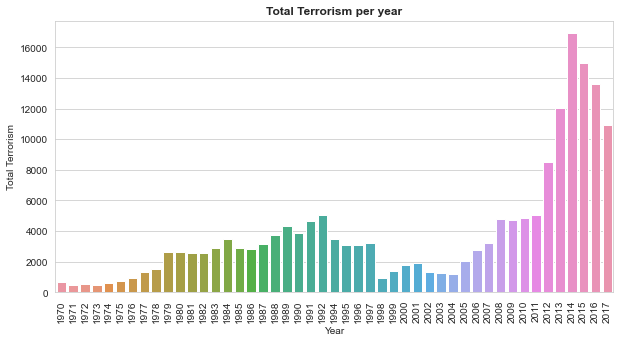

In [47]:
sns.set_style('whitegrid')
plt.figure(figsize=(10,5))
sns.barplot(x = count_by_year.index, y = count_by_year['Country'])
plt.ylabel('Total Terrorism')
plt.xticks(rotation=90)
plt.title('Total Terrorism per year', fontweight='bold')
plt.show()

Trend of global terrorist acts from year to year has a tendency to increase. A high surge was seen in 2003 until reaching its peak in 2014. What actually happened in those years?

From 2015 to 2017 acts of terrorism began to decline.

##  Which experienced the highest terrorism rates?

In [48]:
df2.Year.value_counts()[:10]

2014    16903
2015    14965
2016    13587
2013    12036
2017    10900
2012     8522
2011     5075
1992     5070
2010     4826
2008     4802
Name: Year, dtype: int64


Terrorism often occurred after 2005 and above. Only one year occurred before 2000, namely in 1992.

## Which countries have the highest terrorism rates?

In [49]:
df2.Country.value_counts()[:10]

Iraq              24636
Pakistan          14368
Afghanistan       12731
India             11960
Colombia           8306
Philippines        6908
Peru               6096
El Salvador        5318
United Kingdom     5235
Turkey             4292
Name: Country, dtype: int64

The country with the highest number of terrorism based on this dataset is Iraq. The value is very far from the number of terrorism attacks in the second country, Pakistan, with a difference of nearly 10000 acts of terrorism.

What actually happens in countries with the high rates of terrorism?

## 6 Countries with the highest number of terrorism acts each year.

In [50]:
def show_terorism_per_year(country):
    sns.barplot(df2[df2['Country'] == country].groupby('Year').count()['Country'].index, df2[df2['Country'] == country].groupby('Year').count()['Country'].values) 
    plt.xticks(rotation=90)
    plt.title(f'{country}', fontweight='bold')

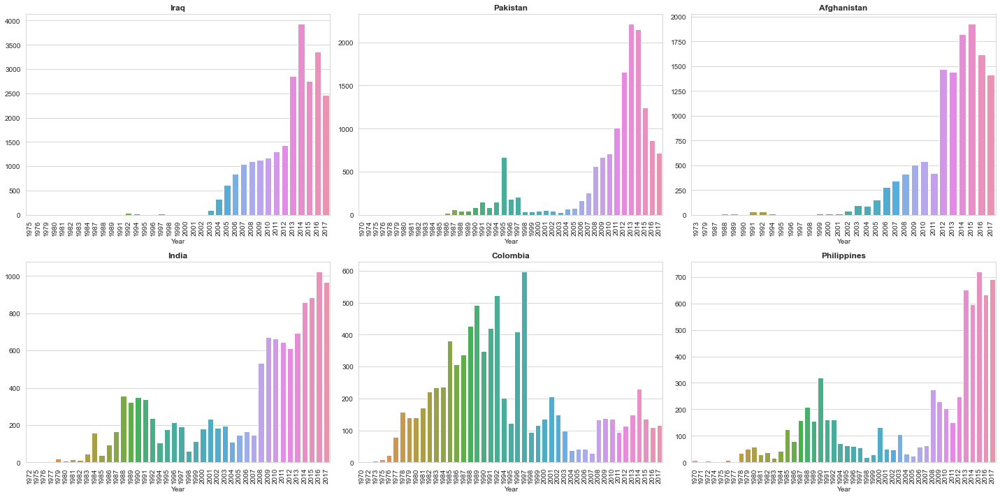

In [51]:
i = 1
plt.figure(figsize=(20,10))
for country in df2.Country.value_counts().index[:6]:
    plt.subplot(2,3, i)
    show_terorism_per_year(country)
    i += 1
plt.tight_layout()
plt.show()


Acts of terrorism in the countries of Iraq, Pakistan, Afghanistan, India and the Philippines began to increase around 2003-2005. While terrorism in Colombia occurred in many 1980s before 2000.

## Terrorism acts that cause the most deaths

In [52]:
max_killed = df2['NumberKill'].max()
df2[df2['NumberKill'] == max_killed]

,Year,Month,Country,Region,Province,City,Lat,Long,AttType,Weapon,TargetType,NatTarget,TerNat,Success,Suicide,GroupName,Individual,NumberKill,NumberWound
133518,2014,6,Iraq,Middle East & North Africa,Saladin,Tikrit,34.621521,43.668377,Hostage Taking (Kidnapping),Firearms,Military,Iraq,1,1,0,Islamic State of Iraq and the Levant (ISIL),0,1570.0,NaN


The act of terrorism that took the most lives (1570 victims) occurred in 2014 in Iraq, the city of Tikrit. The target of this attack is the Military from Iraq.

## Percentage of values from each Categorical column with a pie chart

In [53]:
cat_column

['Month',
 'Region',
 'AttType',
 'Weapon',
 'TargetType',
 'TerNat',
 'Success',
 'Suicide',
 'Individual']

In [54]:
list(df2.Weapon.unique())

['Unknown',
 'Explosives',
 'Incendiary',
 'Firearms',
 'Chemical',
 'Melee',
 'Sabotage Equipment',
 'Vehicle (not to include vehicle-borne explosives, i.e., car or truck bombs)',
 'Fake Weapons',
 'Radiological',
 'Other',
 'Biological']

In [55]:
# Changing Vehicle (not to include vehicle-borne explosives, i.e., car or truck bombs) to Vehicle
df2.Weapon.cat.categories = ['Biological', 'Chemical', 'Explosives', 'Fake Weapons', 'Firearms',
       'Incendiary', 'Melee', 'Other', 'Radiological', 'Sabotage Equipment','Unknown','Vehicle']

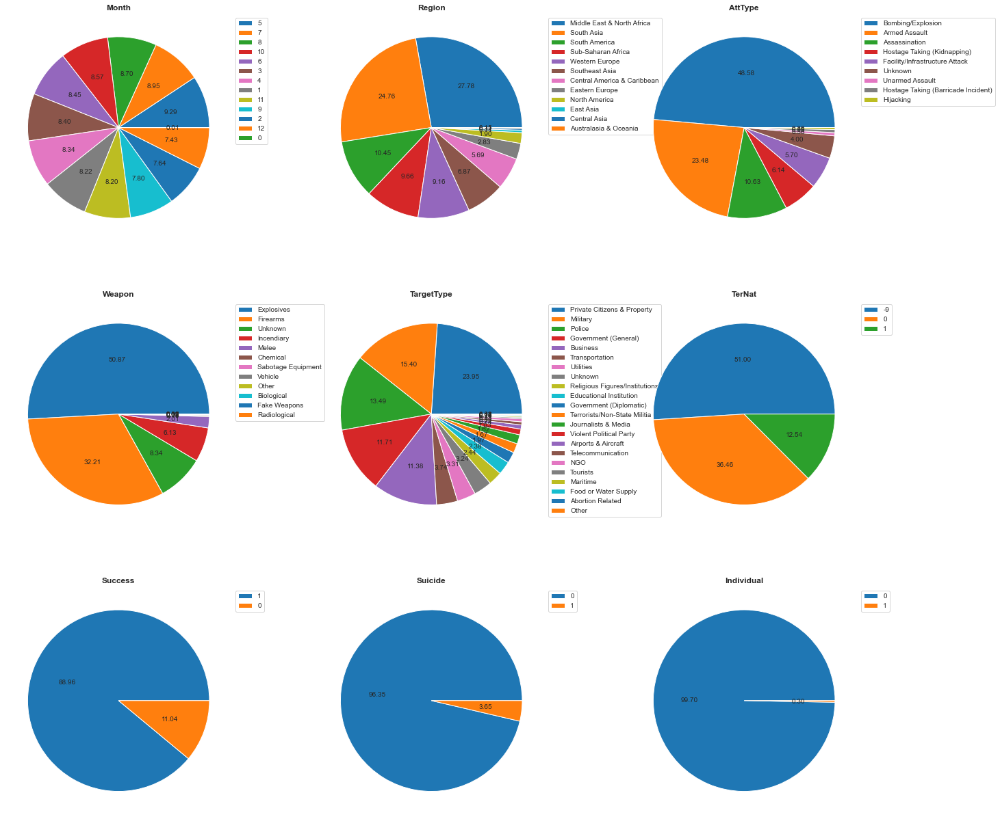

In [56]:
n_row = 3
n_col = 3
fig, axes = plt.subplots(n_row,n_col, figsize=(20,17))
col = 0
for i in range(n_row):
    for j in range(n_col):
        axes[i,j].set_title(cat_column[col], fontweight = 'bold')
        axes[i,j].pie(df2[cat_column[col]].value_counts(), autopct='%.2f')
        axes[i,j].legend(df2[cat_column[col]].value_counts().index, bbox_to_anchor=(1,1,0,0))
        col += 1
plt.tight_layout()


Insight:
Month: All months have a composition that is not much different
Region: Middle East & North Africa Region has the most composition, followed by South Asia and South America Region. This is in accordance with the country that has experienced the most terrorist acts, namely Iraq in the Middle East region. Pakistan, Afghanistan and India in the South Asian region, and Colombia for the South American region.
AttType: Nearly half of terrorism cases are carried out by bombing. Followed by armed Assassination and Assassination.
Weapon: Half the weapons used in all terrorist events in the world are carried out using explosives. This is in line with the type of attack that carried out the bombing. Weapons that are often used after explosives are firearms.
TargetType: The target of almost 25 percent of global terrorism is individuals. Then, military and police.
TerNat: Most nationality of terrorists is unknown, 30% of terrorists have the same citizenship as the target, and 12% of terrorist citizenship is different from the target citizenship.
Success: 89% of global terrorist acts have been successfully carried out.
Suicide: 96% of terrorism is not a suicide.
Individual: Almost all acts of terrorism are carried out in groups. Only 0.03% of the terrorist acts are individuals.

## Terrorist Groups that caused most acts of terrorism

In [57]:
df2['GroupName'].value_counts(normalize=True).head()

Unknown                                             0.455612
Taliban                                             0.041163
Islamic State of Iraq and the Levant (ISIL)         0.030897
Shining Path (SL)                                   0.025073
Farabundo Marti National Liberation Front (FMLN)    0.018435
Name: GroupName, dtype: float64


It turns out that there are so many acts of terrorism that are not known, almost half of the terrorism incidents are unknown. The second largest group is the Taliban in Afghanistan with a composition of 0.04, followed by ISIL in Iraq with a composition of 0.03.

## Is there a correlation between the number of people killed and the number of people injured

In [58]:
df2[['NumberWound', 'NumberKill']].corr()

,NumberWound,NumberKill
NumberWound,1.000000,0.534374
NumberKill,0.534374,1.000000


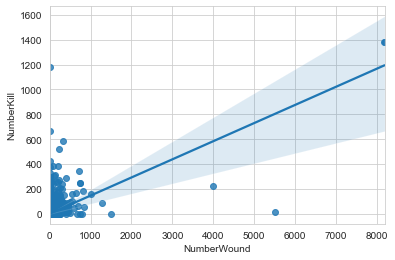

In [59]:
sns.regplot(x='NumberWound', y='NumberKill', data=df2, )


The correlation between NumberKill and NumberWound was positive. The more NumberKill, the more NumberWound.

## Any country whose acts of terrorism have used Biological Weapons

In [60]:
df2[df2['Weapon']=='Biological']['Country'].value_counts(normalize=True).head()

United States     0.685714
Kenya             0.085714
Japan             0.057143
United Kingdom    0.057143
Pakistan          0.057143
Name: Country, dtype: float64


The country with the most terrorist acts using biological weapons is the United States

In [61]:
df2[df2['Country']=='United States'].TerNat.value_counts(normalize=True)

-9    0.508110
 0    0.316643
 1    0.175247
Name: TerNat, dtype: float64


The terrorists who carry out their actions in the United States are mostly unknown by Nationality, 31% of the terrorists have US citizenship, and 17% are not US citizens.

## What happened to Iraq?

In [62]:
df2.Country.value_counts(normalize=True)[:10]

Iraq              0.135609
Pakistan          0.079088
Afghanistan       0.070078
India             0.065834
Colombia          0.045720
Philippines       0.038025
Peru              0.033555
El Salvador       0.029273
United Kingdom    0.028816
Turkey            0.023625
Name: Country, dtype: float64

13% of the incidences of global terrorism occurred in Iraq.

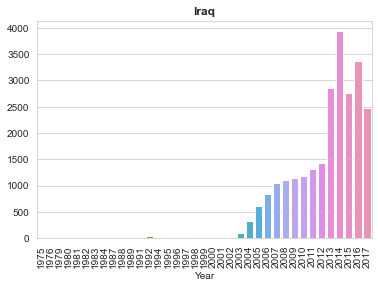

In [63]:
show_terorism_per_year('Iraq')

Since 2003, the rise of terrorism acts have been seen in Iraq.


## What are the conditions in Southeast Asia for the past 10 years?

In [64]:
df_asia_tenggara = df2[df2['Region']=='Southeast Asia']

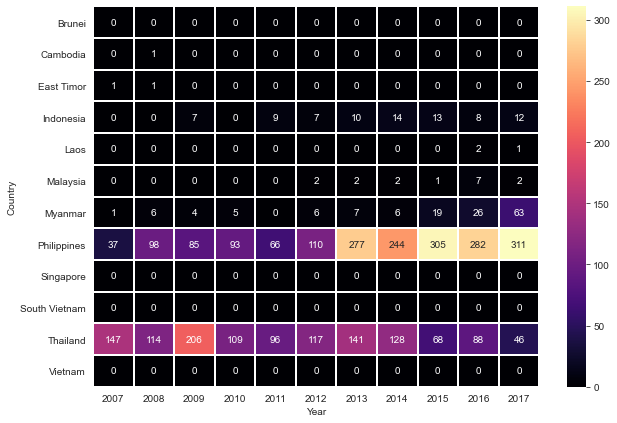

In [65]:
plt.figure(figsize=(10,7))
sns.heatmap(df_asia_tenggara.pivot_table(columns='Year', index='Country', values='NumberKill', aggfunc=np.count_nonzero, fill_value=0
                            ).loc[:, 2007:], linewidths=1, cmap='magma', annot=True, fmt='.0f' )


Among the countries in Southeast Asia. The countries that have experienced the most acts of terrorism in the past 10 years are the Philippines and Thailand. Acts of terrorism in the Philippines even increased significantly in 2013. What happened to the Philippines?

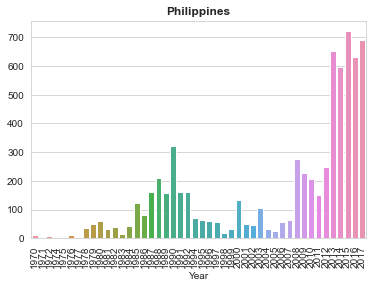

In [66]:
show_terorism_per_year('Philippines')

In [67]:
df_filipina = df2[df2['Country'] == 'Philippines']
df_filipina[df_filipina['Year'] >= 2013].GroupName.value_counts().head()


New People's Army (NPA)                       1351
Unknown                                       1165
Bangsamoro Islamic Freedom Movement (BIFM)     363
Abu Sayyaf Group (ASG)                         286
Maute Group                                     31
Name: GroupName, dtype: int64

There is a lot of terrorism that is driven by a group called the NPA (New People's Army) in the Philippines.

## India